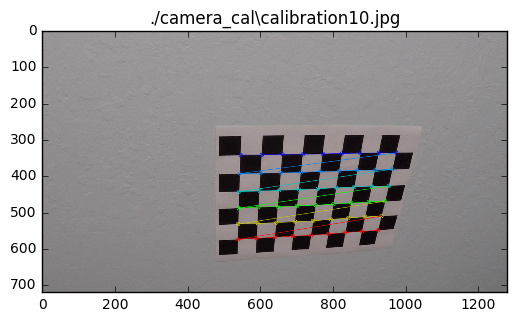

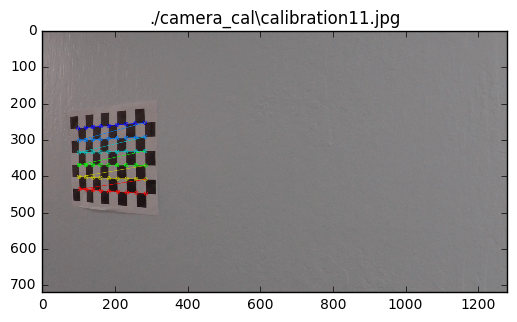

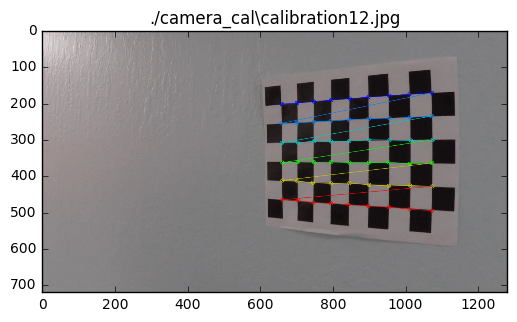

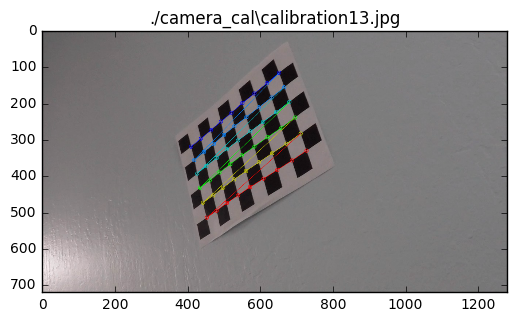

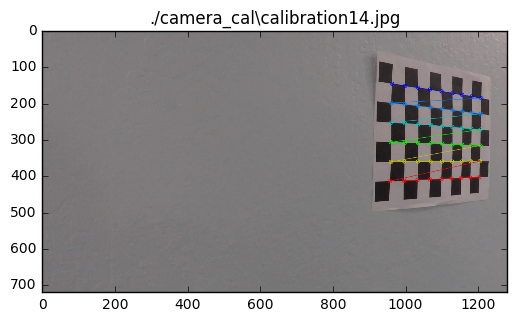

...

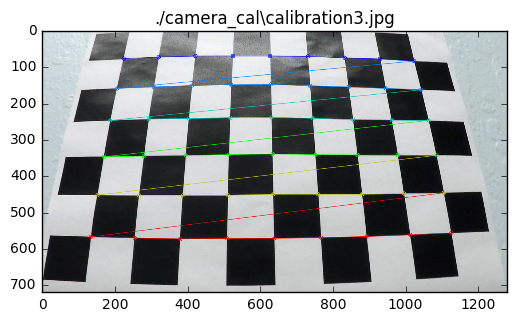

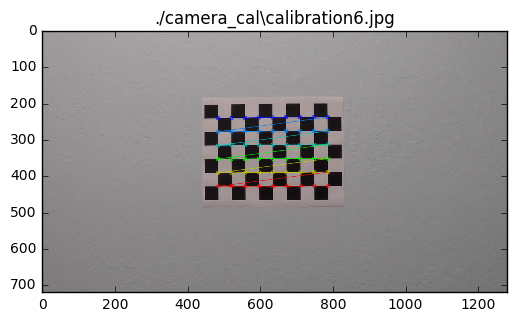

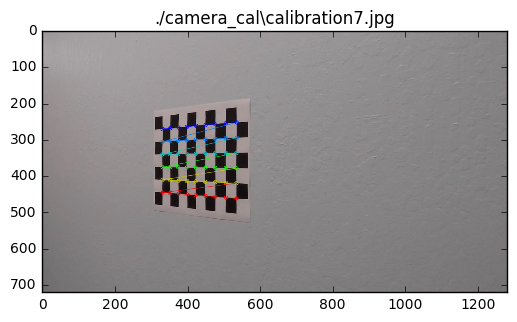

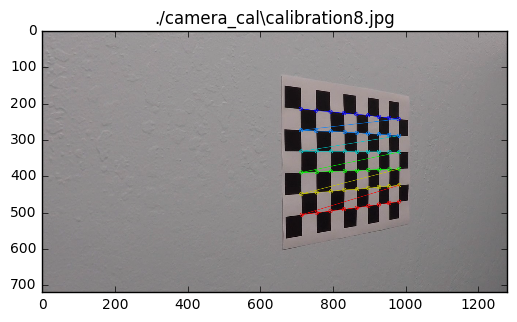

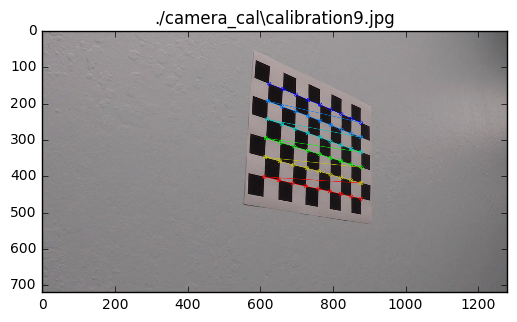

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

def plotmyimage(img,title=''):
    #This function is used during the debug phase. 
    #This just plots the image 
    plt.imshow(img,cmap='gray') # draws in grayscale if it is M x N x 1, draws in color if RGB
    plt.title(title)
    plt.show()
    

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('./camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)
    # If found, add object points, image points
    if ret == True:
        # Find the chessboard corners
        objpoints.append(objp)
        imgpoints.append(corners)
        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        plotmyimage(img,fname)
        #cv2.waitKey(500)

#cv2.destroyAllWindows()
retval,cameraMatrix,distCoeffs,rvecs,tvecs=cv2.calibrateCamera(objpoints,imgpoints,img.shape[0:2],None,None)


    

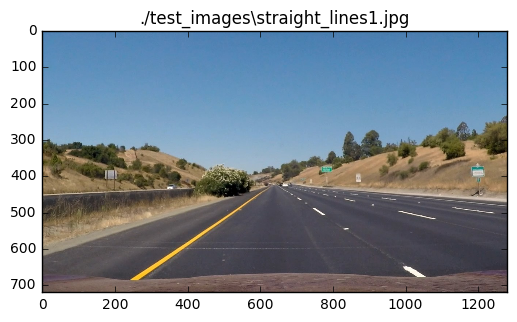

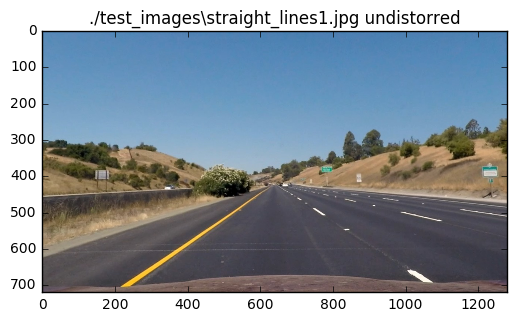

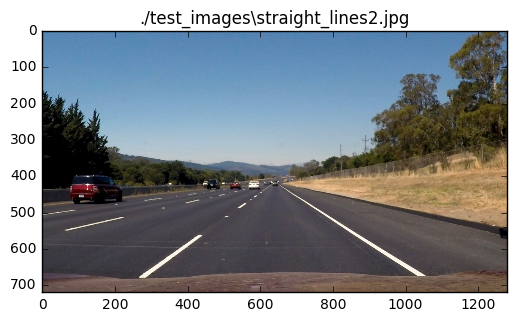

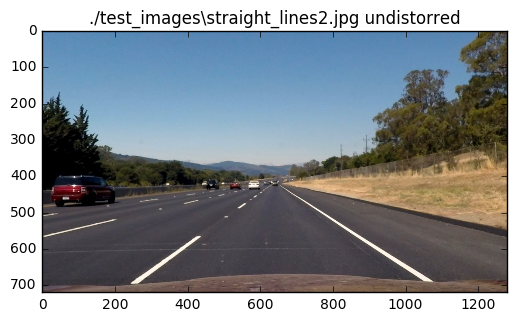

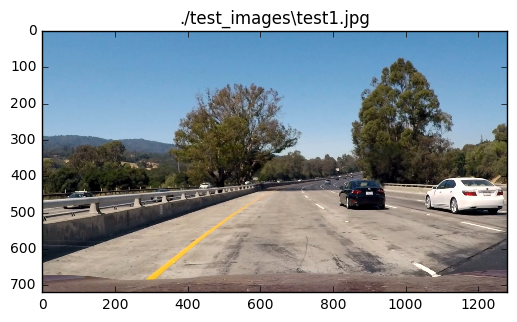

...

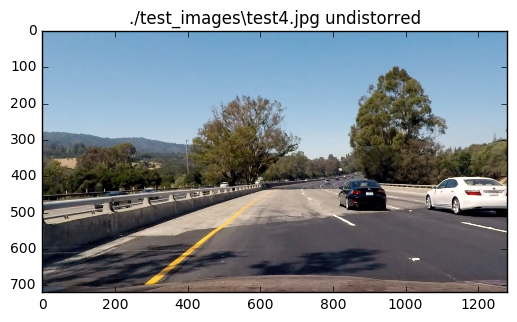

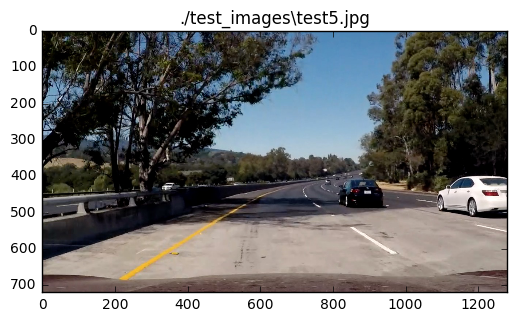

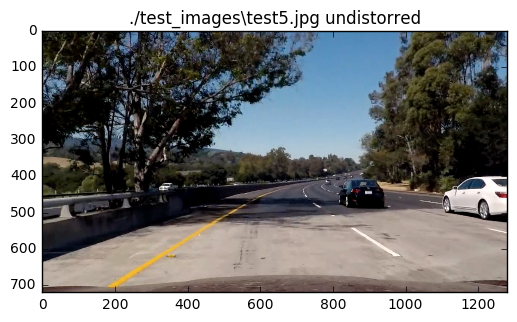

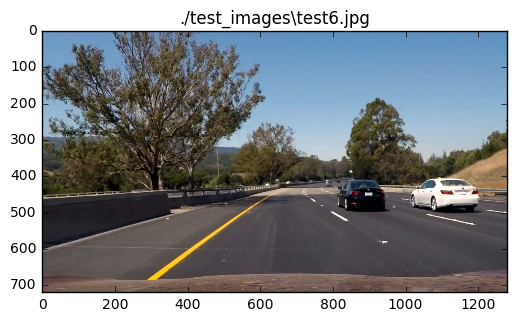

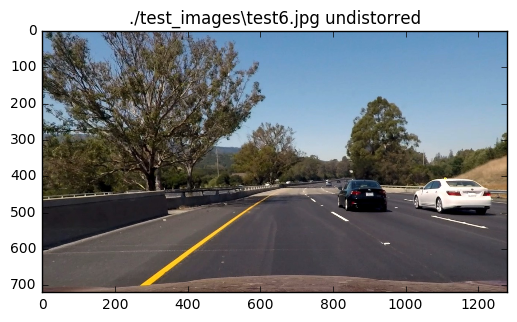

In [4]:
#applying the distorsion correction to the test images
images = glob.glob('./test_images/*.jpg')

for fname in images:
    img=mpimg.imread(fname)
    plotmyimage(img,fname)
    img1 =  cv2.undistort(img, cameraMatrix,distCoeffs,None,cameraMatrix) 
    plotmyimage(img1,fname+' undistorred')

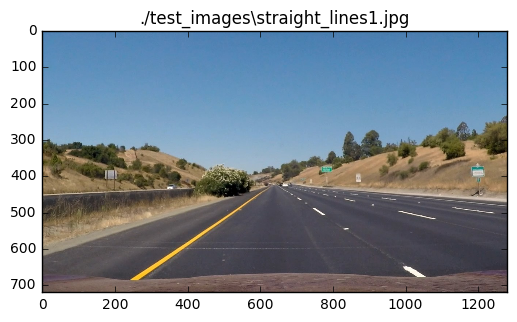

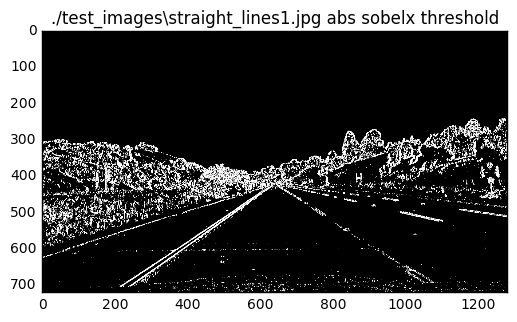

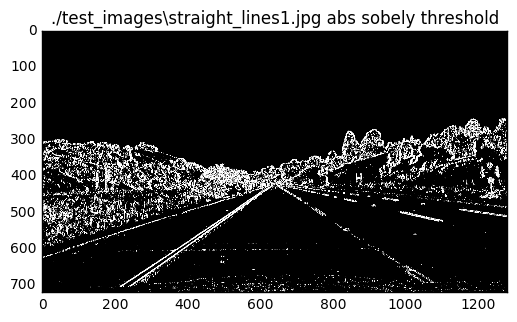

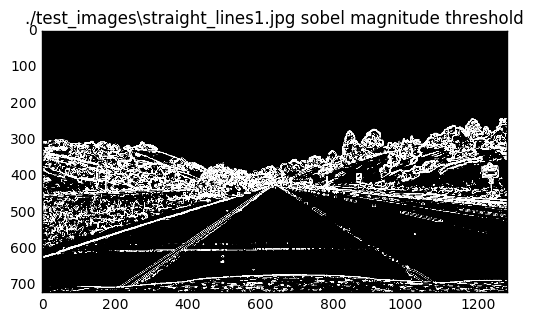

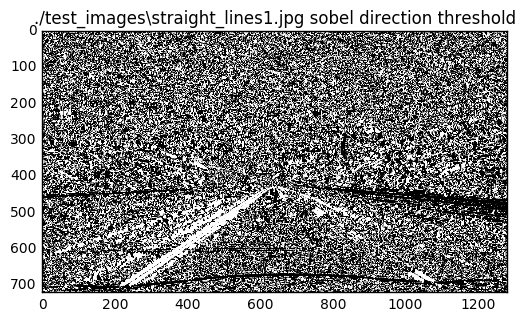

...

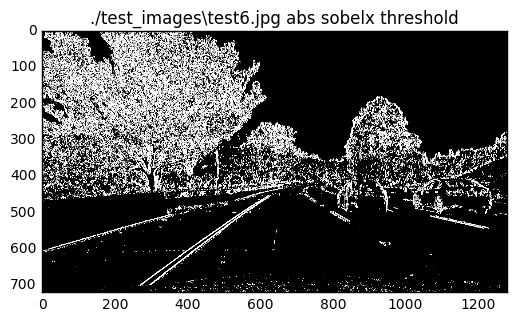

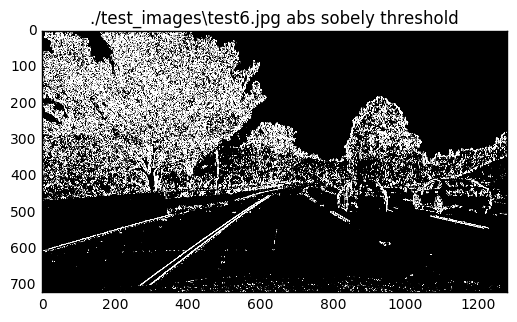

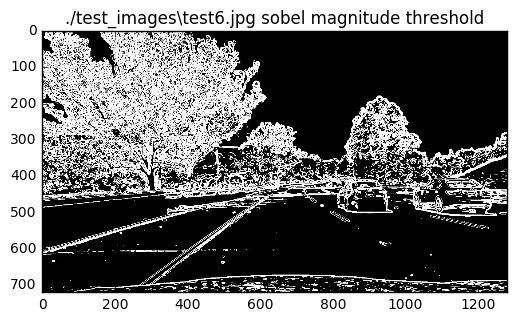

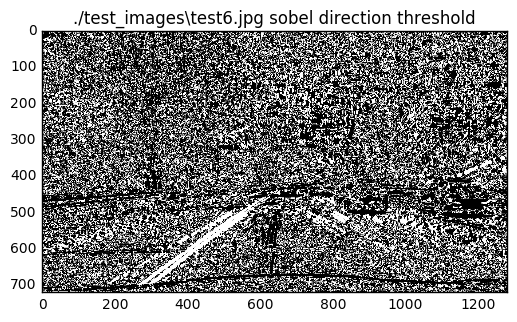

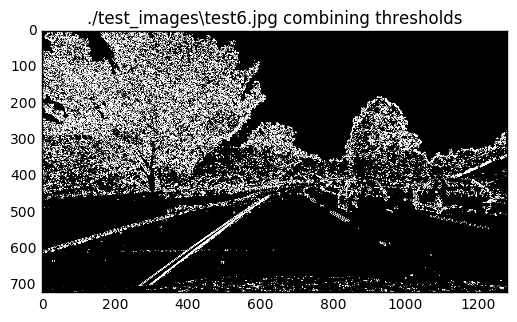

In [19]:
#checking the thresholds code
def abs_sobel_thresh(img, orient='x', thresh_min=0, thresh_max=255):
    gray=cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    if orient=='x':
        sab=np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient=='y':
        sab=np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    sabb=np.uint8(255*sab/np.max(sab))
    

    binary_output = np.zeros_like(sabb)
    binary_output[(sabb >= thresh_min) & (sabb <= thresh_max)] = 1
    return binary_output

def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output

def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output

for fname in images:
    img=mpimg.imread(fname)
    plotmyimage(img,fname)
    
    img =  cv2.undistort(img, cameraMatrix,distCoeffs,None,cameraMatrix) 

    sxbinary=abs_sobel_thresh(img,'x',10,100)
    plotmyimage(sxbinary,fname+' abs sobelx threshold')
    
    sybinary=abs_sobel_thresh(img,'y',10,100)
    plotmyimage(sxbinary,fname+' abs sobely threshold')
    
    sxmag=mag_thresh(img, sobel_kernel=5, mag_thresh=(15, 100))
    plotmyimage(sxmag,fname+' sobel magnitude threshold')
    
    sxdir=dir_threshold(img, sobel_kernel=15, thresh=(0.7, 1.3))
    plotmyimage(sxdir,fname+' sobel direction threshold')
    
    combined = np.zeros_like(sxdir)
    combined[((sxbinary == 1) & (sybinary == 1)) | ((sxmag == 1) & (sxdir == 1))] = 1
    plotmyimage(combined,fname+' combining thresholds')
